# Análisis de sentimiento en textos largos utilizando reseñas de Amazon

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import pickle

from textblob import TextBlob
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from wordcloud import WordCloud
from textwrap import wrap

# FORMATO DE PLOTS
plt.style.use('bmh')

## Hipótesis previas al procesamiento

- Asumimos que el tamaño de muestra de datos de 30K es suficiente para representar la poblacion de ventas.
- Asumimos que la informacion encontrada en cada review será de la suficiente calidad como para entrenar un clasificador de analisis de sentimiento con precisión (>70%).
- Asumimos que el rating numérico de un comentario es un buen reflejo del sentimiento del producto.

## Importación del dataset

El dataset seleccionado para realizar el análisis es del Kaggle: https://www.kaggle.com/datafiniti/consumer-reviews-of-amazon-products 

Es un extracto de la base de datos de Datafiniti, la cual contiene información básica del producto, el comentario y el usuario que lo ha publicado. 

In [7]:
csv = "./dataset/1429_1.csv"
df = pd.read_csv(csv)
df.head()

/usr/lib/python3/dist-packages/IPython/core/interactiveshell.py:3417: DtypeWarning: Columns (1,10) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


,id,name,asins,brand,categories,keys,manufacturer,reviews.date,reviews.dateAdded,reviews.dateSeen,...,reviews.doRecommend,reviews.id,reviews.numHelpful,reviews.rating,reviews.sourceURLs,reviews.text,reviews.title,reviews.userCity,reviews.userProvince,reviews.username
0,AVqkIhwDv8e3D1O-lebb,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",B01AHB9CN2,Amazon,"Electronics,iPad & Tablets,All Tablets,Fire Ta...","841667104676,amazon/53004484,amazon/b01ahb9cn2...",Amazon,2017-01-13T00:00:00.000Z,2017-07-03T23:33:15Z,"2017-06-07T09:04:00.000Z,2017-04-30T00:45:00.000Z",...,True,NaN,0.0,5.0,http://reviews.bestbuy.com/3545/5620406/review...,This product so far has not disappointed. My c...,Kindle,NaN,NaN,Adapter
1,AVqkIhwDv8e3D1O-lebb,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",B01AHB9CN2,Amazon,"Electronics,iPad & Tablets,All Tablets,Fire Ta...","841667104676,amazon/53004484,amazon/b01ahb9cn2...",Amazon,2017-01-13T00:00:00.000Z,2017-07-03T23:33:15Z,"2017-06-07T09:04:00.000Z,2017-04-30T00:45:00.000Z",...,True,NaN,0.0,5.0,http://reviews.bestbuy.com/3545/5620406/review...,great for beginner or experienced person. Boug...,very fast,NaN,NaN,truman
2,AVqkIhwDv8e3D1O-lebb,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",B01AHB9CN2,Amazon,"Electronics,iPad & Tablets,All Tablets,Fire Ta...","841667104676,amazon/53004484,amazon/b01ahb9cn2...",Amazon,2017-01-13T00:00:00.000Z,2017-07-03T23:33:15Z,"2017-06-07T09:04:00.000Z,2017-04-30T00:45:00.000Z",...,True,NaN,0.0,5.0,http://reviews.bestbuy.com/3545/5620406/review...,Inexpensive tablet for him to use and learn on...,Beginner tablet for our 9 year old son.,NaN,NaN,DaveZ
3,AVqkIhwDv8e3D1O-lebb,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",B01AHB9CN2,Amazon,"Electronics,iPad & Tablets,All Tablets,Fire Ta...","841667104676,amazon/53004484,amazon/b01ahb9cn2...",Amazon,2017-01-13T00:00:00.000Z,2017-07-03T23:33:15Z,"2017-06-07T09:04:00.000Z,2017-04-30T00:45:00.000Z",...,True,NaN,0.0,4.0,http://reviews.bestbuy.com/3545/5620406/review...,I've had my Fire HD 8 two weeks now and I love...,Good!!!,NaN,NaN,Shacks
4,AVqkIhwDv8e3D1O-lebb,"All-New Fire HD 8 Tablet, 8 HD Display, Wi-Fi,...",B01AHB9CN2,Amazon,"Electronics,iPad & Tablets,All Tablets,Fire Ta...","841667104676,amazon/53004484,amazon/b01ahb9cn2...",Amazon,2017-01-12T00:00:00.000Z,2017-07-03T23:33:15Z,"2017-06-07T09:04:00.000Z,2017-04-30T00:45:00.000Z",...,True,NaN,0.0,5.0,http://reviews.bestbuy.com/3545/5620406/review...,I bought this for my grand daughter when she c...,Fantastic Tablet for kids,NaN,NaN,explore42


Información del dataset importado:

| Atributo | Descripción | Tipo |
| --- | --- | --- |
| id | - | keyword |
| name | Nombre del producto | text |
| asins | Identificador de Amazon | keyword |
| brand | Marca | text |
| categories | Lista de categorias a las que pertenece | text |
| keys | Lista de identificadores propios de Datafiniti | keyword |
| manufacturer | Fabricante | text |
| reviews.date | Fecha en la que se publicó el comentario | date |
| reviews.dateAdded | - | date |
| reviews.dateSeen | Fecha en la que el comentario fue visto en Datafiniti | date |
| reviews.didPurchase | El usuario ha comprado el producto | boolean |
| reviews.doRecommend | El usuario recomienda el producto | boolean |
| reviews.id | Identificador de la web asociada al comentario | keyword |
| reviews.numHelpful | Numero de personas que encuentran el comentario util | integer |
| reviews.rating | Puntuación de 1 al 5 | float |
| reviews.sourceURLs | Lista de URLs donde el comentario ha sido visto | keyword |
| reviews.text | Texto completo del comentario | text |
| reviews.title | Título del comentario | text |
| reviews.userCity | Ciudad del autor del comentario  | text |
| reviews.userProvince | Provincia del autor del comentario | text |
| reviews.username | Nombre de usuario del autor | text |

Fuente: https://developer.datafiniti.co/docs/product-data-schema

## Exploración y limpieza de datos (EDA)

Comenzaremos explorando las columnas del dataset para comprobar cuántos datos numericos hay por columna, y el tipo de dato que contiene.

In [3]:
data = df.copy()
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34660 entries, 0 to 34659
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    34660 non-null  object 
 1   name                  27900 non-null  object 
 2   asins                 34658 non-null  object 
 3   brand                 34660 non-null  object 
 4   categories            34660 non-null  object 
 5   keys                  34660 non-null  object 
 6   manufacturer          34660 non-null  object 
 7   reviews.date          34621 non-null  object 
 8   reviews.dateAdded     24039 non-null  object 
 9   reviews.dateSeen      34660 non-null  object 
 10  reviews.didPurchase   1 non-null      object 
 11  reviews.doRecommend   34066 non-null  object 
 12  reviews.id            1 non-null      float64
 13  reviews.numHelpful    34131 non-null  float64
 14  reviews.rating        34627 non-null  float64
 15  reviews.sourceURLs 

### Identificación de clave primaria

Candidatos a posible clave primaria: 
- id
- asins
- keys

Haremos un recuento de los campos unicos de cada atributo. 

In [4]:
data["id"].unique()

array(['AVqkIhwDv8e3D1O-lebb', 'AVqVGZO3nnc1JgDc3jGK',
       'AVpe9CMS1cnluZ0-aoC5', 'AVpfBEWcilAPnD_xTGb7',
       'AVqkIiKWnnc1JgDc3khH', 'AVqkIj9snnc1JgDc3khU',
       'AVsRjfwAU2_QcyX9PHqe', 'AVqVGZNvQMlgsOJE6eUY',
       'AVpfwS_CLJeJML43DH5w', 'AVphgVaX1cnluZ0-DR74',
       'AVqVGZN9QMlgsOJE6eUZ', 'AVpftoij1cnluZ0-p5n2',
       'AVqkIhxunnc1JgDc3kg_', 'AVpioXbb1cnluZ0-PImd',
       'AVpff7_VilAPnD_xc1E_', 'AVpjEN4jLJeJML43rpUe',
       'AVpg3q4RLJeJML43TxA_', 'AVqVGWLKnnc1JgDc3jF1',
       'AV1YnRtnglJLPUi8IJmV', 'AVphPmHuilAPnD_x3E5h',
       'AVzvXXxbvKc47QAVfRhy', 'AVpe7AsMilAPnD_xQ78G',
       'AVph0EeEilAPnD_x9myq', 'AVqkIdntQMlgsOJE6fuB',
       'AVzRlorb-jtxr-f3ygvQ', 'AVqVGWQDv8e3D1O-ldFr',
       'AVzvXXwEvKc47QAVfRhx', 'AVpgdkC8ilAPnD_xsvyi',
       'AV1YnR7wglJLPUi8IJmi', 'AVpfl8cLLJeJML43AE3S',
       'AVqkEM34QMlgsOJE6e8q', 'AVzoGHhAglJLPUi8GfzY',
       'AVpfIfGA1cnluZ0-emyp', 'AVphLY7v1cnluZ0-_Ty0',
       'AVpf_4sUilAPnD_xlwYV', 'AVpidLjVilAPnD_xEVpI',
       'AV

In [5]:
print(len(data["id"].unique()))

42


In [6]:
data["asins"].unique()

array(['B01AHB9CN2', 'B00VINDBJK', 'B005PB2T0S', 'B002Y27P3M',
       'B01AHB9CYG', 'B01AHB9C1E', 'B01J2G4VBG', 'B00ZV9PXP2',
       'B0083Q04TA', 'B018Y229OU', 'B00REQKWGA', 'B00IOYAM4I',
       'B018T075DC', nan, 'B00DU15MU4', 'B018Y225IA', 'B005PB2T2Q',
       'B018Y23MNM', 'B00OQVZDJM', 'B00IOY8XWQ', 'B00LO29KXQ',
       'B00QJDU3KY', 'B018Y22C2Y', 'B01BFIBRIE', 'B01J4ORNHU',
       'B018SZT3BK', 'B00UH4D8G2', 'B018Y22BI4', 'B00TSUGXKE',
       'B00L9EPT8O,B01E6AO69U', 'B018Y23P7K', 'B00X4WHP5E', 'B00QFQRELG',
       'B00LW9XOJM', 'B00QL1ZN3G', 'B0189XYY0Q', 'B01BH83OOM',
       'B00BFJAHF8', 'B00U3FPN4U', 'B002Y27P6Y', 'B006GWO5NE',
       'B006GWO5WK'], dtype=object)

In [7]:
print(len(data["asins"].unique()))

42


In [8]:
data["keys"].unique()

array(['841667104676,amazon/53004484,amazon/b01ahb9cn2,0841667104676,allnewfirehd8tablet8hddisplaywifi16gbincludesspecialoffersmagenta/5620406,allnewfirehd8tablet8hddisplaywifi16gbincludesspecialoffersmagenta/b01ahb9cn2',
       'kindleoasisereaderwithleatherchargingcovermerlot6highresolutiondisplay300ppiwifiincludesspecialoffers/5234468,amazon/b00vindbjk,kindleoasisereaderwithleatherchargingcovermerlot6highresolutiondisplay300ppiwifiincludesspecialoffers/b00vindbjk,848719069587,0848719069587',
       'amazonkindlelightedleathercover/b005pb2t0s',
       'kindlekeyboard/b002y27p3m,amazon/d01101',
       '841667104690,allnewfirehd8tablet8hddisplaywifi32gbincludesspecialoffersmagenta/5620408,0841667104690,allnewfirehd8tablet8hddisplaywifi32gbincludesspecialoffersmagenta/b01ahb9cyg,amazon/53004761',
       'amazon/b01ahb9c1e,0841667104577,firehd8tabletwithalexa8hddisplay32gbtangerinewithspecialoffers/b01ahb9c1e,firehd8tabletwithalexa8hddisplay32gbtangerinewithspecialoffers/5620411,84166710

In [9]:
print(len(data["keys"].unique()))

42


Conclusiones: 
    1. Como no existe ni id, asins o keys unicas para cada reseña, no identificamos ninguna como clave primaria.
    2. A la hora de eliminar atributos hay que tener en cuenta que existen 42 clasificaciones de productos, por lo que se debe comprobar cuántos quedarían y que no se elimine ninguno representativo.

Para hacer la comprobación de eliminar los valores nulos, voy a tomar como referencia asins ya que es un atributo propio de Amazon.

Objetivo: visualizar la distibución de asins para despues compararla con la resultante si eliminamos los NaN de las columnas reviews.doRecommend y reviews.numHelpful

Recuento de productos que hay por cada asin de menor a mayor:

<AxesSubplot:>

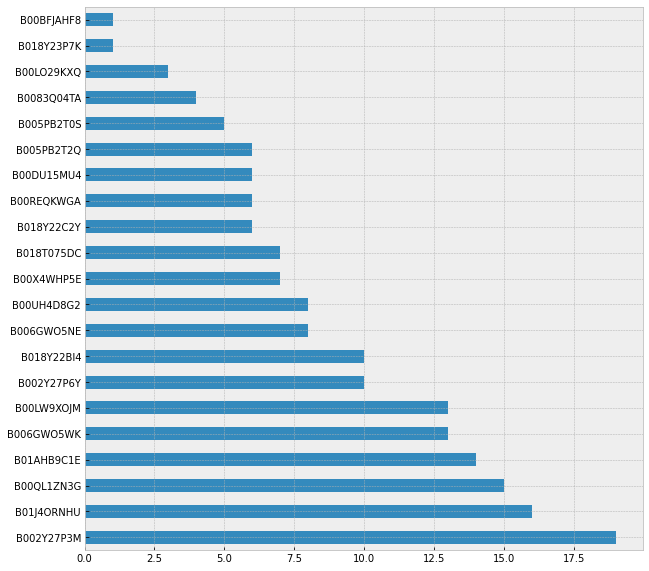

In [10]:
data["asins"].value_counts()[20:41].plot(kind="barh", figsize=(10, 10))

<AxesSubplot:>

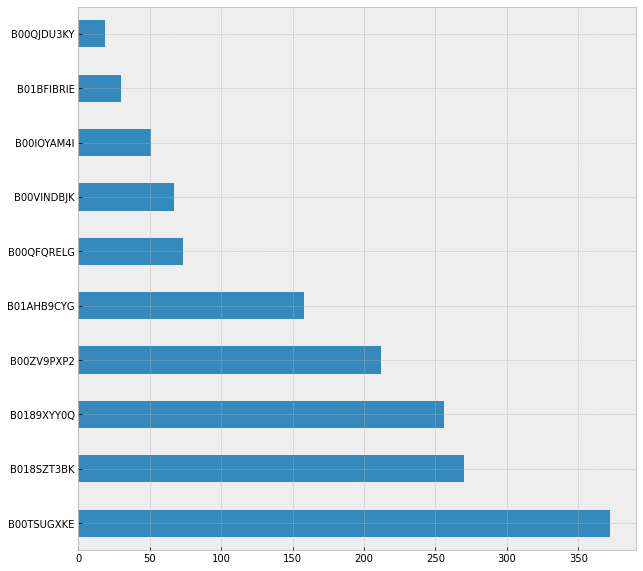

In [11]:
data["asins"].value_counts()[10:20].plot(kind="barh", figsize=(10, 10))

<AxesSubplot:>

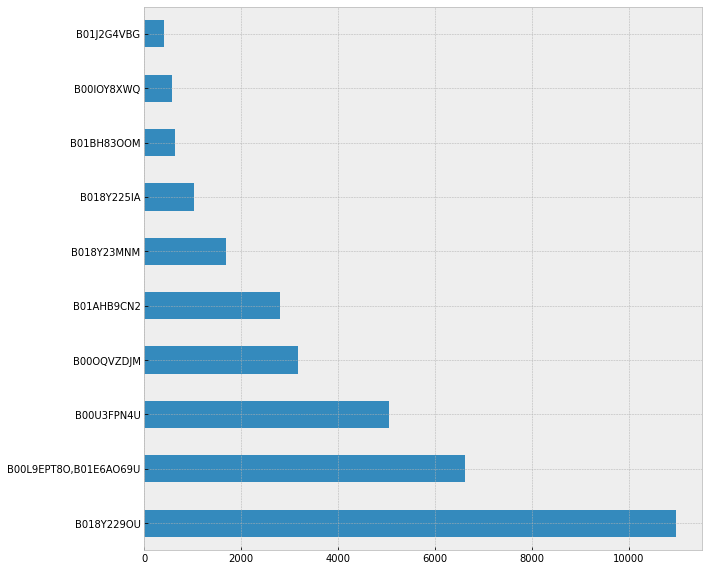

In [12]:
data["asins"].value_counts()[0:10].plot(kind="barh", figsize=(10, 10))

### Eliminación de columnas

Comenzaremos eliminando aquellos atributos que no sean de utilidad a la hora de realizar un análisis de sentimientos

#### Eliminación de atributos propios de Datafiniti:
- keys: lista de identificadores de Datafiniti, no es de utilidad y aumentaba la complejidad de análsis.
- reviews.dateSeen: fecha en la que el comentario fue visto en Datafiniti, misma casuística que la anterior. 

In [13]:
data = data.drop(columns=["keys", "reviews.dateSeen"])

#### Eliminación de atributos que no aportan valor en un análisis de sentimientos:
- reviews.sourceURL: no necesitamos la url fuente donde se encuentre el comentario para analizarlo.
- reviews.id o reviews.asins: elegir que columna utilizar para referenciar los nombres y eliminar el otro identificador.

In [14]:
data = data.drop(columns=["reviews.sourceURLs"])

Como id contiene todos sus registros, mientras que asins tiene 2 valores vacios, vamos a comprobar qué productos faltan

In [15]:
data.groupby("id")["asins"].unique()

id
AV1YE_muvKc47QAVgpwE               [B00U3FPN4U]
AV1YnR7wglJLPUi8IJmi               [B00TSUGXKE]
AV1YnRtnglJLPUi8IJmV               [B00OQVZDJM]
AVpe7AsMilAPnD_xQ78G               [B00QJDU3KY]
AVpe8PEVilAPnD_xRYIi               [B00BFJAHF8]
AVpe9CMS1cnluZ0-aoC5               [B005PB2T0S]
AVpfBEWcilAPnD_xTGb7               [B002Y27P3M]
AVpfIfGA1cnluZ0-emyp               [B00QFQRELG]
AVpf_4sUilAPnD_xlwYV               [B00QL1ZN3G]
AVpf_znpilAPnD_xlvAF               [B002Y27P6Y]
AVpff7_VilAPnD_xc1E_               [B00DU15MU4]
AVpfiBlyLJeJML43-4Tp               [B006GWO5WK]
AVpfl8cLLJeJML43AE3S    [B00L9EPT8O,B01E6AO69U]
AVpfpK8KLJeJML43BCuD               [B01BH83OOM]
AVpftoij1cnluZ0-p5n2               [B00IOYAM4I]
AVpfwS_CLJeJML43DH5w               [B0083Q04TA]
AVpg3q4RLJeJML43TxA_               [B005PB2T2Q]
AVpgdkC8ilAPnD_xsvyi               [B018Y22BI4]
AVpggqsrLJeJML43O5zp               [B006GWO5NE]
AVph0EeEilAPnD_x9myq               [B018Y22C2Y]
AVphLY7v1cnluZ0-_Ty0               [B

Como solo es un producto el cual no tenemos su asin, vamos a eliminar id ya que es una columna cuya información no sabemos qué representa, mientras que asins tenemos la seguridad que trata ddel identificador propio de Amazon.

In [16]:
data = data.drop(columns=["id"])

#### Eliminación de atributos que contengan pocos registros:

Primero comprobamos el numero de valores NaN que contiene cada registro:

<AxesSubplot:>

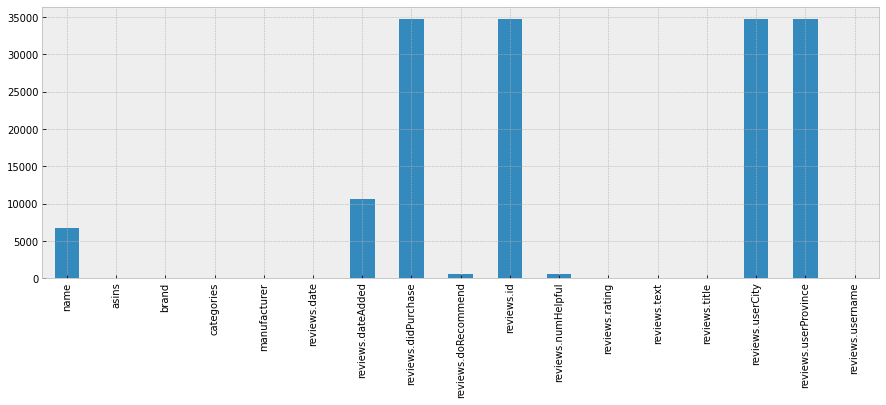

In [17]:
data.isna().sum().plot(kind='bar', figsize=(15, 5))

In [18]:
data.isna().sum()

name                     6760
asins                       2
brand                       0
categories                  0
manufacturer                0
reviews.date               39
reviews.dateAdded       10621
reviews.didPurchase     34659
reviews.doRecommend       594
reviews.id              34659
reviews.numHelpful        529
reviews.rating             33
reviews.text                1
reviews.title               5
reviews.userCity        34660
reviews.userProvince    34660
reviews.username            2
dtype: int64

Vamos a eliminar:
- reviews.dateAdded: tiene 10621 campos vacíos. Podemos prescindir de ella ya que en la descripción de columnas no sabíamos qué representaba.
- reviews.didPurchase: tiene 34659 campos vacíos. Podemos prescindir de ella ya que en la descripción de columnas no aclara si se refiere a compras exclusivamente realizadas en Amazon o no.
- reviews.id: tiene 34659 campos vacíos. En este caso para un análisis de sentimiento no necesitamos usar un identificador, y menos si tiene tantos campos vacíos.
- reviews.userCity y reviews.userProvince: tienen 34660 campos vacíos, el 100% de las filas. Ni la ciudad ni provincia del autor del comentario eran datos representativos para un análisis de sentimientos.

In [19]:
data = data.drop(columns=["reviews.dateAdded", "reviews.didPurchase",
                 "reviews.id", "reviews.userCity", "reviews.userProvince"])

Eliminación de valores nulos cuyas filas no contengan doRecommend o numHelpful:

In [20]:
dataNaN = data.dropna(subset=["reviews.doRecommend", "reviews.numHelpful"])
dataNaN.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 34064 entries, 0 to 34624
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   name                 27409 non-null  object 
 1   asins                34064 non-null  object 
 2   brand                34064 non-null  object 
 3   categories           34064 non-null  object 
 4   manufacturer         34064 non-null  object 
 5   reviews.date         34064 non-null  object 
 6   reviews.doRecommend  34064 non-null  object 
 7   reviews.numHelpful   34064 non-null  float64
 8   reviews.rating       34064 non-null  float64
 9   reviews.text         34064 non-null  object 
 10  reviews.title        34061 non-null  object 
 11  reviews.username     34062 non-null  object 
dtypes: float64(2), object(10)
memory usage: 3.4+ MB


<AxesSubplot:>

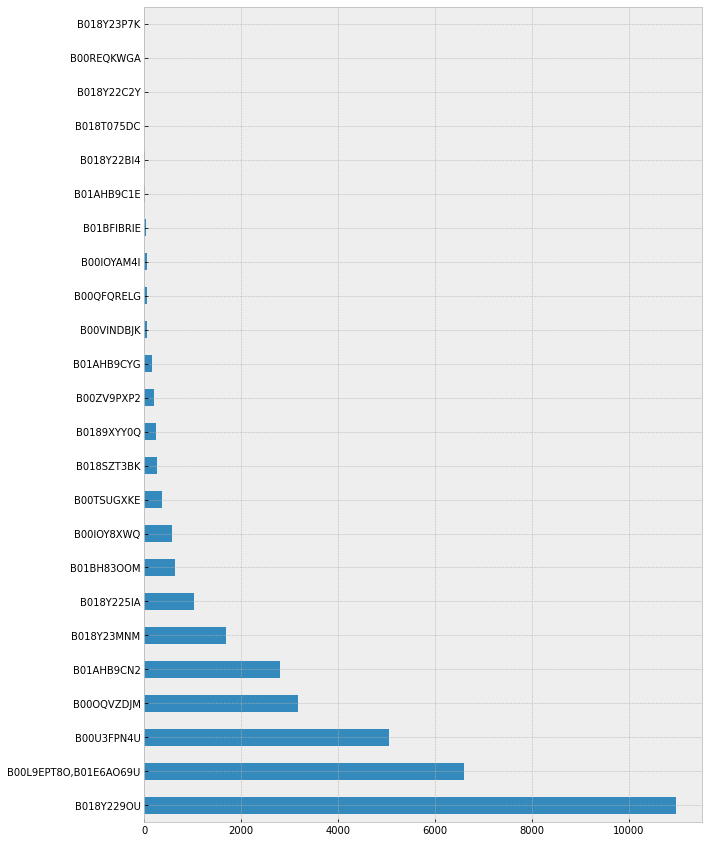

In [21]:
dataNaN["asins"].value_counts().plot(kind="barh", figsize=(10, 15))

In [22]:
print(len(dataNaN["asins"].unique()))

24


Conclusión: 
    1. Como podemos observar, los registros de asins pasan de 42 a 24, y entre ellos hay productos con más de 10K datos, por lo que no es posible eliminar los NaN de las columnas seleccionadas.
    2. No podemos suprimir los NaN porque nos quedaríamos sin la variedad necesaria para el entrenamiento, evitando así posibles sesgos.

#### Dataframe resultante con las columnas seleccionadas:

In [23]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34660 entries, 0 to 34659
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   name                 27900 non-null  object 
 1   asins                34658 non-null  object 
 2   brand                34660 non-null  object 
 3   categories           34660 non-null  object 
 4   manufacturer         34660 non-null  object 
 5   reviews.date         34621 non-null  object 
 6   reviews.doRecommend  34066 non-null  object 
 7   reviews.numHelpful   34131 non-null  float64
 8   reviews.rating       34627 non-null  float64
 9   reviews.text         34659 non-null  object 
 10  reviews.title        34655 non-null  object 
 11  reviews.username     34658 non-null  object 
dtypes: float64(2), object(10)
memory usage: 3.2+ MB


Utilidad de cada atributo:
- name: Nombre del producto, necesario para ser enlazado con asins y buscar si hay algún sesgo. 
- asins: Identificador de Amazon.  
- brand y manufacturer: Encontrar si hay un sesgo entre una marca o fabricante en concreto
- categories: Poder comparar si existen mejores comentarios en distintas categorías.
- reviews.date: Analizar fechas importantes donde hay picos de comentarios como festivos. 
- reviews.doRecommend: Relacionar la recomendación de los usuarios con los ratings, si puede darse el caso que esté sesgado según sea verdadero o falso.
- reviews.numHelpful: Ver si el número de personas que encuentran el comentario util se concentran en una puntuación concreta.
- reviews.rating: Puntuación de 1 al 5 que tomamos como el reflejo principal del sentimiento hacia un producto. Nos ayudará a realizar el entrenamiento de sentimiento sin tener que hacer un etiquetado manual.
- reviews.text: Texto completo del comentario. Al no existir una clave primaria, tomamos el propio texto como tal.
- reviews.title: Título del comentario que ayudará a complementar el texto para su análisis.
- reviews.username: Nombre de usuario del autor, encontrar la media de cúanto opina cada usuario.

Los atributos pertenecientes a las reseñas: date, doRecommend, numHelpful y username no forman parte del análisis del lenguaje, pero enriquece a los análisis estadísticos que nos permitirán conseguir mayores y mejores conclusiones.

## Conversión de tipos

Como al importar los datos, por defecto no diferencia su tipo y toma los atributos como object, vamos a castearlos a sus tipos correctos automáticamente:

In [24]:
data = data.convert_dtypes()

In [25]:
data.dtypes

name                    string
asins                   string
brand                   string
categories              string
manufacturer            string
reviews.date            string
reviews.doRecommend    boolean
reviews.numHelpful       Int64
reviews.rating           Int64
reviews.text            string
reviews.title           string
reviews.username        string
dtype: object

Corregimos manualmente los tipos que no han sido bien transformados

In [26]:
# DATES
data["reviews.date"] = pd.to_datetime(data["reviews.date"])

# FLOATS
data["reviews.rating"] = data["reviews.rating"].astype(float)

# BOOLEANS DE TRUE/FALSE A 1/0
data["reviews.doRecommend"] = data["reviews.doRecommend"].astype('Int64')

In [27]:
data.dtypes

name                                string
asins                               string
brand                               string
categories                          string
manufacturer                        string
reviews.date           datetime64[ns, UTC]
reviews.doRecommend                  Int64
reviews.numHelpful                   Int64
reviews.rating                     float64
reviews.text                        string
reviews.title                       string
reviews.username                    string
dtype: object

Comprobamos que los booleanos hayan cambiado correctamente su valor:

In [28]:
print(data["reviews.doRecommend"])

0           1
1           1
2           1
3           1
4           1
         ... 
34655    <NA>
34656    <NA>
34657    <NA>
34658    <NA>
34659    <NA>
Name: reviews.doRecommend, Length: 34660, dtype: Int64


## Distribución de atributos

### Análisis de atributos numéricos

#### Polaridad de los comentarios

Utilizaremos textblob como referente en el análisis para realizar una comparacion bidireccional. Por un lado orientarnos y saber si el analisis y algoritmos utilizados son los correctos, y por otro realizar una comprobación viceversa y ver si la librería obtiene la misma calidad en los resultados.

In [29]:
data = data[~data['reviews.text'].isnull()]
data['polarity'] = data['reviews.text'].map(
    lambda text: TextBlob(text).sentiment.polarity)

<AxesSubplot:ylabel='Density'>

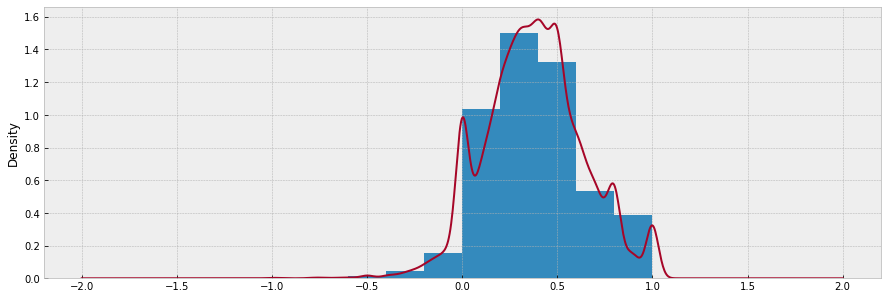

In [30]:
data['polarity'].plot(kind='hist', figsize=(15, 5), density=True)
data['polarity'].plot(kind='kde', figsize=(15, 5))

#### reviews.rating

Vamos a buscar un sesgo entre las puntuaciones.

Text(0, 0.5, 'Frequency')

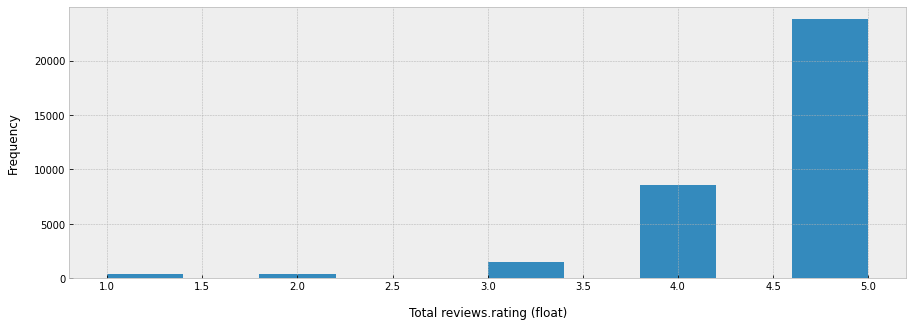

In [31]:
data['reviews.rating'].plot(kind='hist', figsize=(15, 5))
plt.xlabel("Total reviews.rating (float)", labelpad=14)
plt.ylabel("Frequency", labelpad=14)

Conclusión se puede observar, hay una mayor cantidad de datos con una puntuación de cinco estrellas que sumando el resto de puntuaciones. Esto puede hacer que consigamos un mejor entrenamiento en sentimientos positivos que negativos.

#### reviews.numHelpful

El objetivo de visualizar numHelpful es comprobar donde se concentran los datos, ya que al tener un valor máximo de 109 debemos ver qué porcentaje representa para considerar el suprimir aquellos valores que puedan generar ruido al análisis.

Text(0, 0.5, 'Frequency')

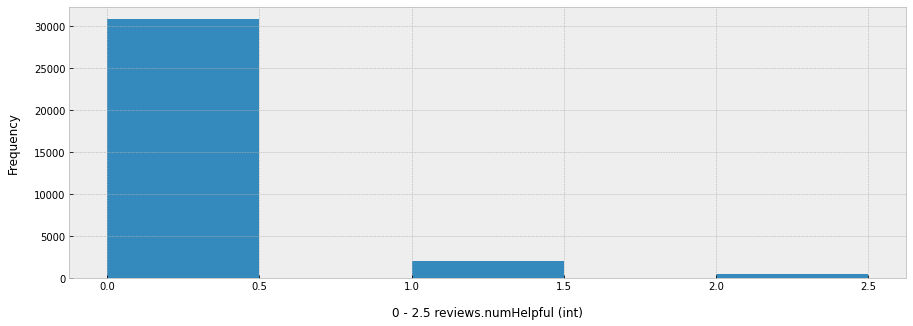

In [32]:
# numHelpful de 0 a 2.5
data['reviews.numHelpful'].plot(
    kind='hist', bins=[0, 0.5, 1, 1.5, 2, 2.5], figsize=(15, 5))
plt.xlabel("0 - 2.5 reviews.numHelpful (int)", labelpad=14)
plt.ylabel("Frequency", labelpad=14)

Text(0, 0.5, 'Frequency')

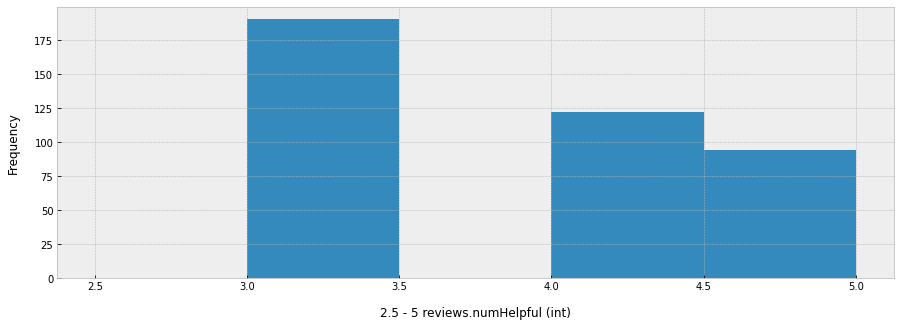

In [33]:
# numHelpful de 2.5 a 5
data['reviews.numHelpful'].plot(
    kind='hist', bins=[2.5, 3, 3.5, 4, 4.5, 5], figsize=(15, 5))
plt.xlabel("2.5 - 5 reviews.numHelpful (int)", labelpad=14)
plt.ylabel("Frequency", labelpad=14)

Como conclusión excluiremos los valores que pueden añadir ruido en los resultados estadísticos. En este caso solo se tendrá en cuenta los comentarios que tengan menos de 5 votos utiles, ya que en adelante tienen una frecuencia menor de 100, por lo que son despreciables.

In [34]:
data = data[data["reviews.numHelpful"] <= 5]

In [35]:
data["reviews.numHelpful"].describe()

count    33837.000000
mean         0.138931
std          0.534203
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          5.000000
Name: reviews.numHelpful, dtype: float64

#### reviews.doRecommend

Ahora buscaremos un sesgo entre las recomendaciones.

Text(0, 0.5, 'Frequency')

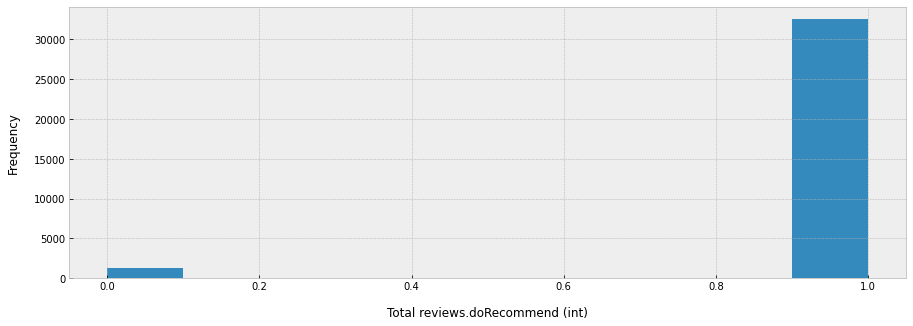

In [36]:
data['reviews.doRecommend'].plot(kind='hist', figsize=(15, 5))
plt.xlabel("Total reviews.doRecommend (int)", labelpad=14)
plt.ylabel("Frequency", labelpad=14)

Al igual que ocurre con rating, hay más datos concetrados en los que representan un valor positivo.

#### Análisis descriptivo de los atributos analizados hasta ahora:

In [37]:
data.describe()

,reviews.doRecommend,reviews.numHelpful,reviews.rating,polarity
count,33829.000000,33837.000000,33837.000000,33837.000000
mean,0.960566,0.138931,4.593108,0.380217
std,0.194627,0.534203,0.714961,0.261209
min,0.000000,0.000000,1.000000,-1.000000
25%,1.000000,0.000000,4.000000,0.206250
50%,1.000000,0.000000,5.000000,0.377778
75%,1.000000,0.000000,5.000000,0.537500
max,1.000000,5.000000,5.000000,1.000000


### Análisis del resto de tipos 

#### reviews.date

Observaremos las fechas con el objetivo de encontrar una moda de comentarios.

<AxesSubplot:>

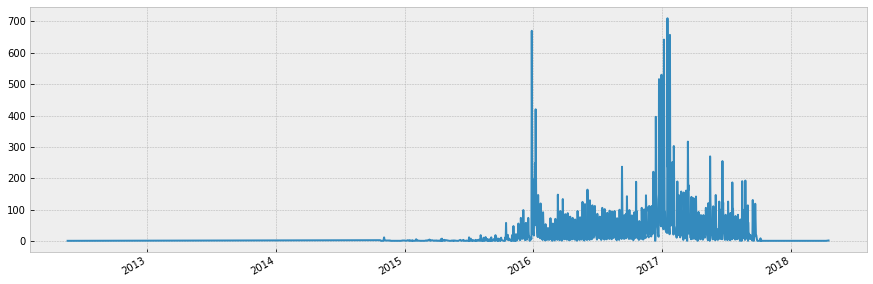

In [38]:
data["reviews.date"].value_counts().sort_index().plot(figsize=(15, 5))

In [39]:
data["reviews.date"].describe(datetime_is_numeric=True)

count                                  33837
mean     2016-10-31 13:46:49.682241280+00:00
min                2012-05-20 00:00:00+00:00
25%                2016-06-11 00:00:00+00:00
50%                2016-12-24 00:00:00+00:00
75%                2017-03-10 00:00:00+00:00
max                2018-04-18 00:00:00+00:00
Name: reviews.date, dtype: object

In [40]:
data["reviews.date"].describe()

<ipython-input-40-60a00c21a3a7>:1: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  data["reviews.date"].describe()


count                         33837
unique                          930
top       2017-01-16 00:00:00+00:00
freq                            710
first     2012-05-20 00:00:00+00:00
last      2018-04-18 00:00:00+00:00
Name: reviews.date, dtype: object

Encontramos un patron donde se comenta más en diciembre-enero, coincidiendo con época de fiestas.

#### reviews.username

Recuento de comentarios por username para poder realizar un análisis, si resulta de interés, sobre usuarios que pueden ser sospechosos por el número de comentarios publicados.

In [41]:
data["reviews.username"].value_counts().reset_index(name='counts')

,index,counts
0,Mike,137
1,Chris,90
2,John,84
3,Dave,68
4,Bill,57
...,...,...
26135,Techmaster,1
26136,Danno,1
26137,llinot,1
26138,Nikdawg,1


In [42]:
data["reviews.username"].describe()

count     33835
unique    26140
top        Mike
freq        137
Name: reviews.username, dtype: object

## Relaciones entre atributos

El objetivo de las siguientes gráficas es observar si la relación entre reviews.ratings y otras columnas está sesgada.

#### polarity / reviews.rating

Se quiere comprobar la hipótesis de que los ratings tienen el suficiente valor como para ser la variable de entrenamiento que refleja el sentimiento. 

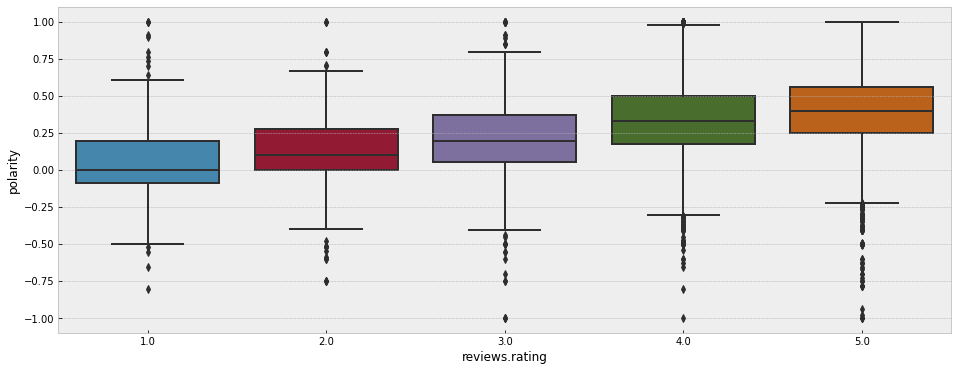

In [43]:
fig, ax = plt.subplots(figsize=(16, 6))

fig = sns.boxplot(x='reviews.rating', y='polarity', data=data)

medians = data.groupby(['reviews.rating'])['polarity'].median()
vertical_offset = data['polarity'].median() * 0.05


plt.show()

Como se puede observar, el rating está altamente correlacionado con la polaridad del sentimiento, por lo que se concluye que la hipotesis realizada es cierta y se acepta.

#### reviews.doRecommend / reviews.rating

In [44]:
data[{"reviews.rating", "reviews.doRecommend"}
     ].value_counts().sort_index().reset_index(name='count')

,reviews.doRecommend,reviews.rating,count
0,0,1.0,306
1,0,2.0,312
2,0,3.0,521
3,0,4.0,132
4,0,5.0,63
5,1,1.0,25
6,1,2.0,57
7,1,3.0,935
8,1,4.0,8279
9,1,5.0,23199


<AxesSubplot:ylabel='reviews.doRecommend,reviews.rating'>

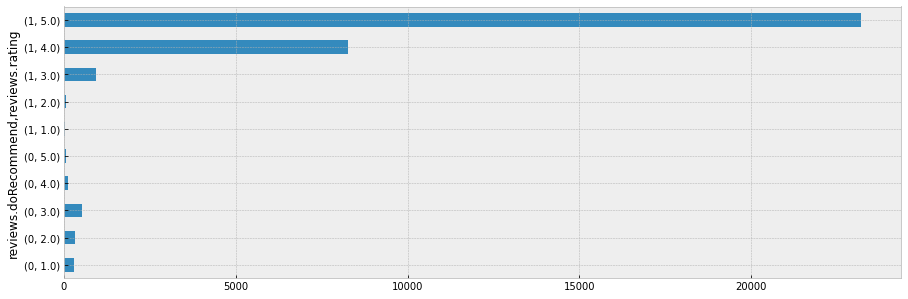

In [45]:
data[{"reviews.doRecommend", "reviews.rating"}].value_counts(
).sort_index().plot(kind="barh", figsize=(15, 5))

Conclusión: a mayor sea el rating numérico de un comentario, tiene mayor tendencia a recomendar el producto.

#### reviews.numHelpful / reviews.rating

In [46]:
data[{"reviews.numHelpful", "reviews.rating"}
     ].value_counts().sort_index().reset_index(name='count')

,reviews.rating,reviews.numHelpful,count
0,1.0,0,229
1,1.0,1,43
2,1.0,2,28
3,1.0,3,10
4,1.0,4,14
5,1.0,5,9
6,2.0,0,303
7,2.0,1,38
8,2.0,2,13
9,2.0,3,5


<AxesSubplot:ylabel='reviews.rating,reviews.numHelpful'>

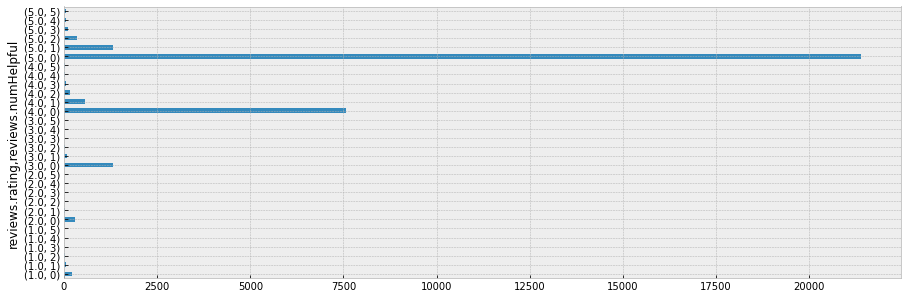

In [47]:
data[{"reviews.rating", "reviews.numHelpful"}].value_counts(
).sort_index().plot(kind="barh", figsize=(15, 5))

Conclusión: lo normal es que indiferentemente de la puntuación dada, un comentario no tenga votos de utilidad, y en cualquier caso, lo más representativo es tener un voto al dar una puntuación de 5 estrellas.

#### reviews.username / reviews.rating

<AxesSubplot:>

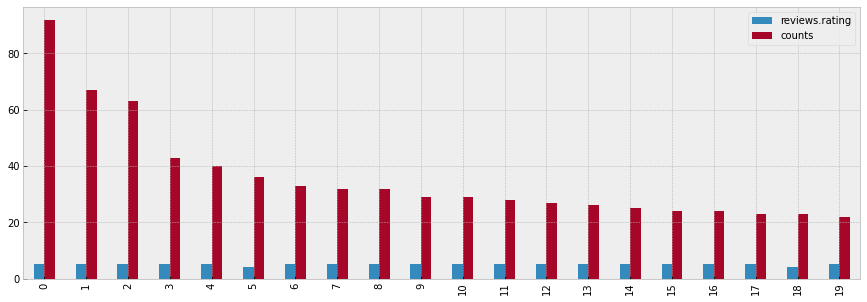

In [48]:
data[{"reviews.rating", "reviews.username"}].value_counts()[:20].reset_index(
    name='counts').plot(kind="bar", figsize=(15, 5))

Como conclusión se puede observar que las personas opinan poco, pero se puede observar un sesgo en cuanto opiniones positivas.

#### brand / manufacturer

Esta comparativa la realizo simplemente para comprobar de forma gŕafica la diferencia entre brand y manufacturer.

<AxesSubplot:>

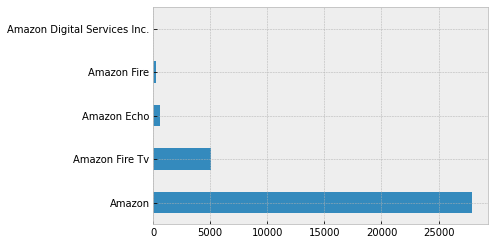

In [49]:
data["brand"].value_counts().plot(kind='barh')

<AxesSubplot:>

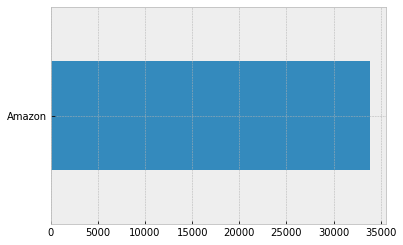

In [50]:
data["manufacturer"].value_counts().plot(kind='barh')

## Análisis del lenguaje

In [51]:
neg_reviews = data.loc[data['reviews.rating'] <= 2]

### n-gramas

La visualización de los n-gramas nos dará una idea exploratoria de los terminos más frecuentes.

In [52]:
def get_top_ngrams(df, n=None, ngrams=None):
    vec = CountVectorizer(ngram_range=(ngrams, ngrams),
                          stop_words='english').fit(df)
    bag_of_words = vec.transform(df)
    sum_words = bag_of_words.sum(axis=0)

    words_freq = [(word, sum_words[0, i])
                  for word, i in vec.vocabulary_.items()]
    words_freq = sorted(words_freq, key=lambda x: x[1], reverse=True)

    return words_freq[:n]

<AxesSubplot:xlabel='word'>

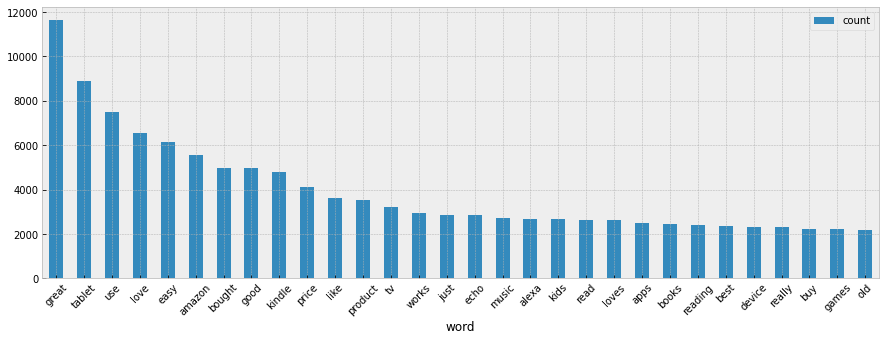

In [53]:
# Distribution of top unigrams (removing stop words)
common_words = get_top_ngrams(data['reviews.text'], 30, 1)
df_ngram = pd.DataFrame(common_words, columns=['word', 'count'])
df_ngram.plot(kind="bar", x='word', y='count', rot=45, figsize=(15, 5))

<AxesSubplot:xlabel='word'>

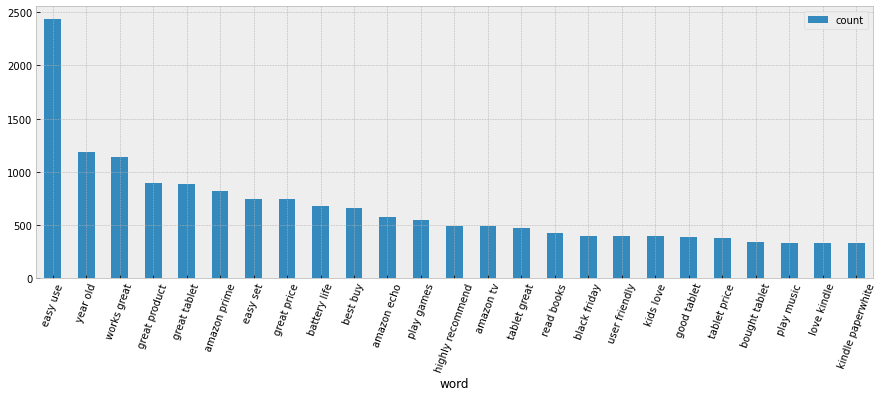

In [54]:
# Distribution of top bigrams (removing stop words)
common_words = get_top_ngrams(data['reviews.text'], 25, 2)
df_ngram = pd.DataFrame(common_words, columns=['word', 'count'])
df_ngram.plot(kind="bar", x='word', y='count', rot=70, figsize=(15, 5))

<AxesSubplot:xlabel='word'>

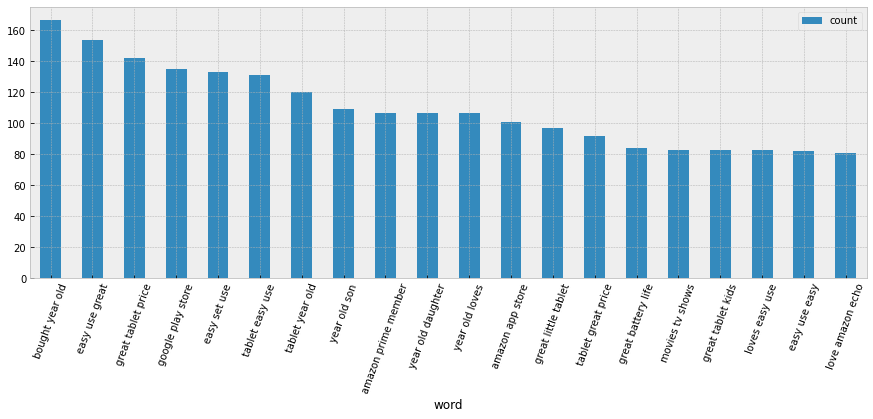

In [55]:
# Distribution of top trigrams (removing stop words)
common_words = get_top_ngrams(data['reviews.text'], 20, 3)
df_ngram = pd.DataFrame(common_words, columns=['word', 'count'])
df_ngram.plot(kind="bar", x='word', y='count', rot=70, figsize=(15, 5))

In [56]:
def get_by_wordtype(text, wordtype):
    blob = TextBlob(text)
    return [word for (word, tag) in blob.tags if tag.startswith(wordtype)]

<AxesSubplot:xlabel='word'>

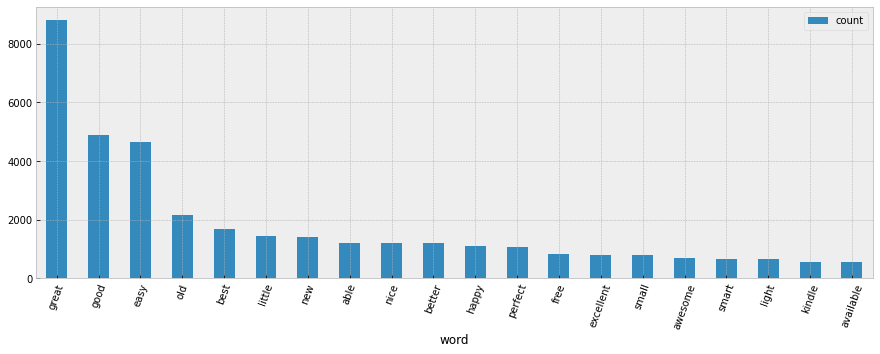

In [57]:
# Distribution of top adjectives (removing stop words)
data['adjectives'] = data['reviews.text'].apply(get_by_wordtype, args=("JJ", ))
common_words = get_top_ngrams(data['adjectives'].astype(str), 20, 1)
df_ngram = pd.DataFrame(common_words, columns=['word', 'count'])
df_ngram.plot(kind="bar", x='word', y='count', rot=70, figsize=(15, 5))

<AxesSubplot:xlabel='word'>

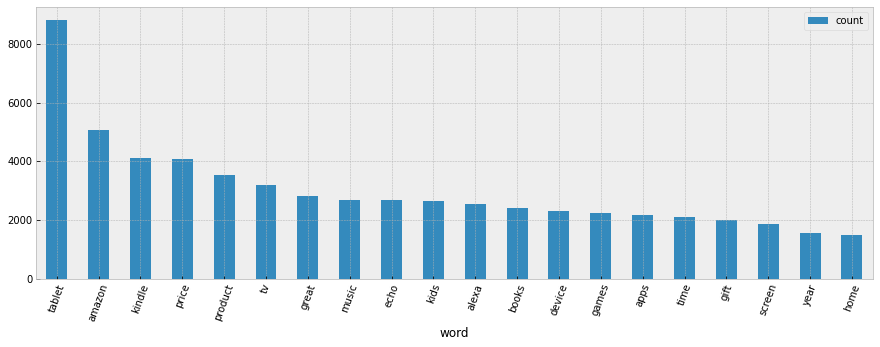

In [58]:
# Distribution of top nouns (removing stop words)
data['nouns'] = data['reviews.text'].apply(get_by_wordtype, args=("NN", ))
common_words = get_top_ngrams(data['nouns'].astype(str), 20, 1)
df_ngram = pd.DataFrame(common_words, columns=['word', 'count'])
df_ngram.plot(kind="bar", x='word', y='count', rot=70, figsize=(15, 5))

<AxesSubplot:xlabel='word'>

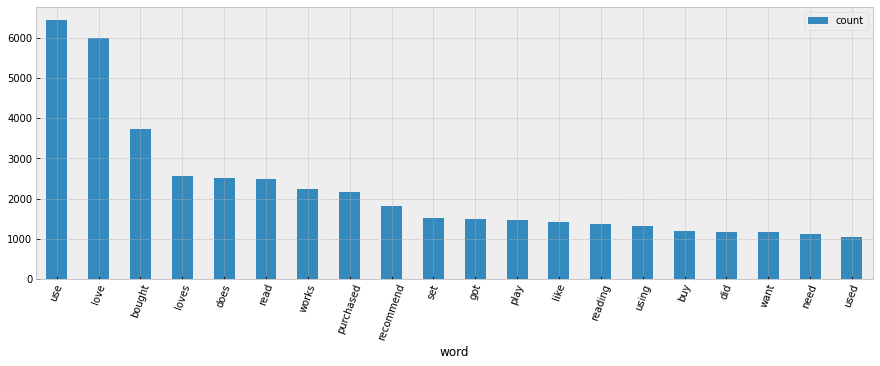

In [59]:
# Distribution of top verbs (removing stop words)
data['verbs'] = data['reviews.text'].apply(get_by_wordtype, args=("VB", ))
common_words = get_top_ngrams(data['verbs'].astype(str), 20, 1)
df_ngram = pd.DataFrame(common_words, columns=['word', 'count'])
df_ngram.plot(kind="bar", x='word', y='count', rot=70, figsize=(15, 5))

Como conclusión, los resultados se encuentran en armonía con el resto del análisis, sin detectarse palabras de sentimiento negativo y con mayor frecuencia palabras que se pueden asociar a lo positivo (great, easy use, love)

A continuación se realizará el mismo análisis pero filtrando solo los comentarios con un rating igual menor de 2.

<ipython-input-60-4d238e6f105f>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  neg_reviews['adjectives'] = neg_reviews['reviews.text'].apply(get_by_wordtype, args=("JJ", ))


<AxesSubplot:xlabel='word'>

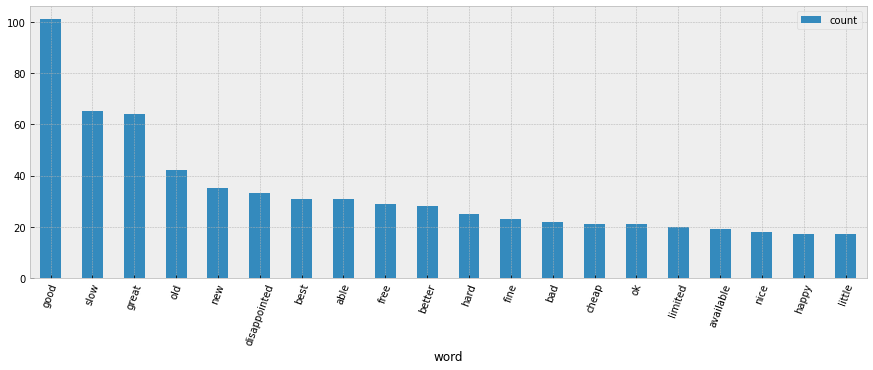

In [60]:
# Distribution of top adjectives (removing stop words)
neg_reviews['adjectives'] = neg_reviews['reviews.text'].apply(get_by_wordtype, args=("JJ", ))
common_words = get_top_ngrams(neg_reviews['adjectives'].astype(str), 20, 1)
df_ngram = pd.DataFrame(common_words, columns=['word', 'count'])
df_ngram.plot(kind="bar", x='word', y='count', rot=70, figsize=(15, 5))

<ipython-input-61-6c1f471bc063>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  neg_reviews['nouns'] = neg_reviews['reviews.text'].apply(get_by_wordtype, args=("NN", ))


<AxesSubplot:xlabel='word'>

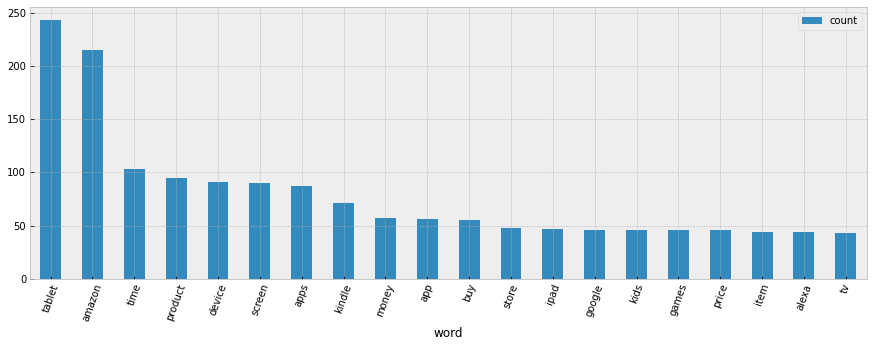

In [61]:
# Distribution of top nouns (removing stop words)
neg_reviews['nouns'] = neg_reviews['reviews.text'].apply(get_by_wordtype, args=("NN", ))
common_words = get_top_ngrams(neg_reviews['nouns'].astype(str), 20, 1)
df_ngram = pd.DataFrame(common_words, columns=['word', 'count'])
df_ngram.plot(kind="bar", x='word', y='count', rot=70, figsize=(15, 5))

<ipython-input-62-1c90203e2a84>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  neg_reviews['verbs'] = neg_reviews['reviews.text'].apply(get_by_wordtype, args=("VB", ))


<AxesSubplot:xlabel='word'>

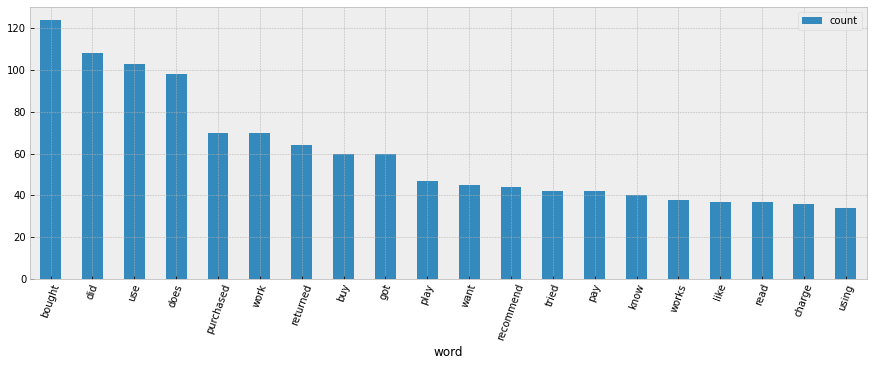

In [62]:
# Distribution of top verbs (removing stop words)
neg_reviews['verbs'] = neg_reviews['reviews.text'].apply(get_by_wordtype, args=("VB", ))
common_words = get_top_ngrams(neg_reviews['verbs'].astype(str), 20, 1)
df_ngram = pd.DataFrame(common_words, columns=['word', 'count'])
df_ngram.plot(kind="bar", x='word', y='count', rot=70, figsize=(15, 5))

### 6.2. Nubes de palabras

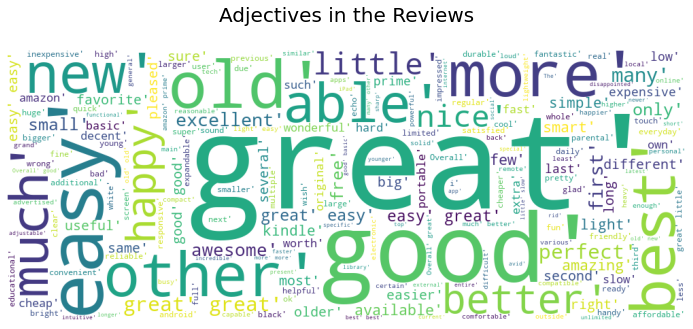

In [63]:
rt = data['adjectives'].astype(str)
wordcloud = WordCloud(background_color='white',
                      width=1000,
                      height=400
                      ).generate(" ".join(rt))
plt.figure(figsize=(15, 5))
plt.imshow(wordcloud)
plt.title('Adjectives in the Reviews\n', size=20)
plt.axis('off')
plt.show()

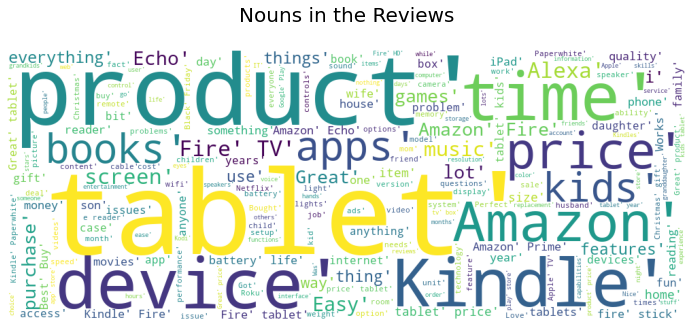

In [64]:
rt = data['nouns'].astype(str)
wordcloud = WordCloud(background_color='white',
                      width=1000,
                      height=400
                      ).generate(" ".join(rt))
plt.figure(figsize=(15, 5))
plt.imshow(wordcloud)
plt.title('Nouns in the Reviews\n', size=20)
plt.axis('off')
plt.show()

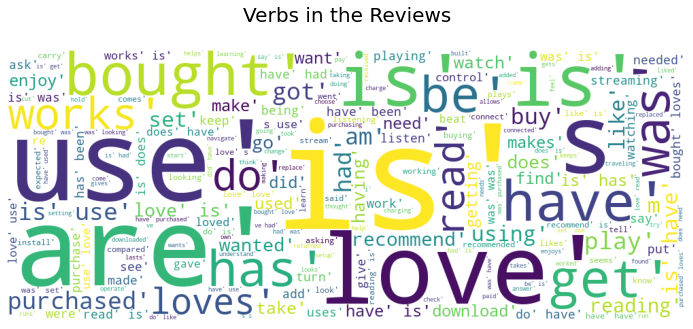

In [65]:
rt = data['verbs'].astype(str)
wordcloud = WordCloud(background_color='white',
                      width=1000,
                      height=400
                      ).generate(" ".join(rt))
plt.figure(figsize=(15, 5))
plt.imshow(wordcloud)
plt.title('Verbs in the Reviews\n', size=20)
plt.axis('off')
plt.show()

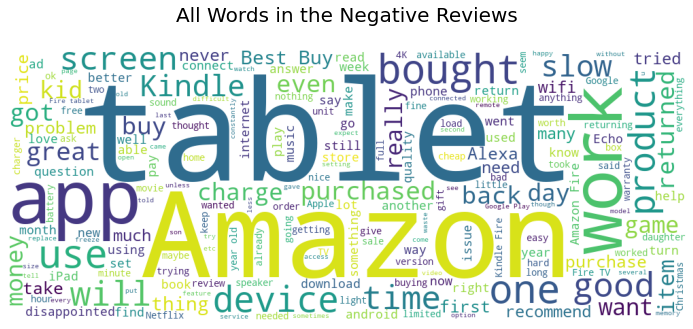

In [66]:
rt = neg_reviews['reviews.text']
wordcloud = WordCloud(background_color='white',
                      width=1000,
                      height=400
                      ).generate(" ".join(rt))
plt.figure(figsize=(15, 5))
plt.imshow(wordcloud)
plt.title('All Words in the Negative Reviews\n', size=20)
plt.axis('off')
plt.show()

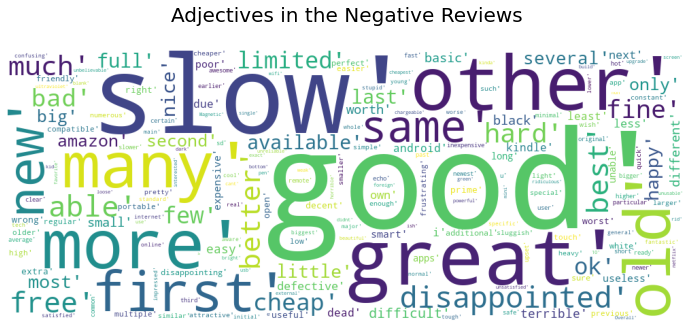

In [67]:
rt = neg_reviews['adjectives'].astype(str)
wordcloud = WordCloud(background_color='white',
                      width=1000,
                      height=400
                      ).generate(" ".join(rt))
plt.figure(figsize=(15, 5))
plt.imshow(wordcloud)
plt.title('Adjectives in the Negative Reviews\n', size=20)
plt.axis('off')
plt.show()

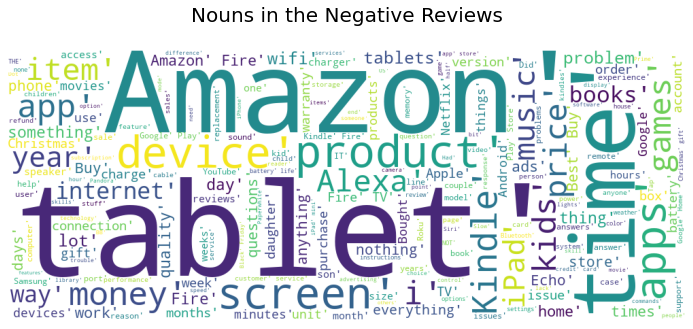

In [68]:
rt = neg_reviews['nouns'].astype(str)
wordcloud = WordCloud(background_color='white',
                      width=1000,
                      height=400
                      ).generate(" ".join(rt))
plt.figure(figsize=(15, 5))
plt.imshow(wordcloud)
plt.title('Nouns in the Negative Reviews\n', size=20)
plt.axis('off')
plt.show()

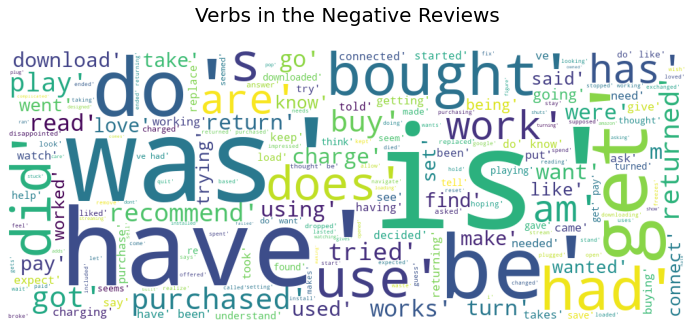

In [69]:
rt = neg_reviews['verbs'].astype(str)
wordcloud = WordCloud(background_color='white',
                      width=1000,
                      height=400
                      ).generate(" ".join(rt))
plt.figure(figsize=(15, 5))
plt.imshow(wordcloud)
plt.title('Verbs in the Negative Reviews\n', size=20)
plt.axis('off')
plt.show()

In [70]:
df_grouped = data[['categories', 'reviews.text']].groupby(
    by='categories').agg(lambda x: ' '.join(x))

cv = CountVectorizer(analyzer='word', stop_words='english')
cv_data = cv.fit_transform(df_grouped['reviews.text'])
df_dtm = pd.DataFrame(cv_data.toarray(), columns=cv.get_feature_names_out())
df_dtm.index = df_grouped.index


def generate_wordcloud(data, title):
    wc = WordCloud(width=400, height=330, max_words=150,
                   colormap="Dark2").generate_from_frequencies(data)
    plt.figure(figsize=(10, 8))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.title('\\n'.join(wrap(title, 60)), fontsize=13)
    plt.show()


# Transposing document term matrix
df_dtm = df_dtm.transpose()

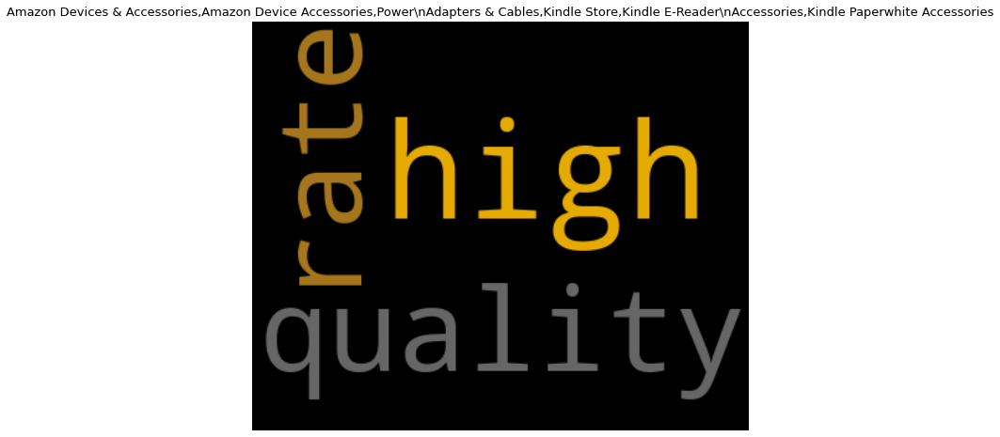

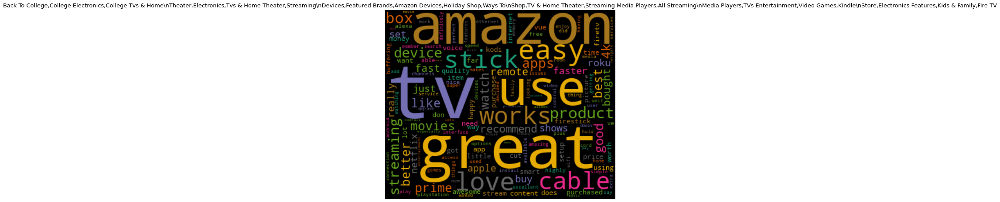

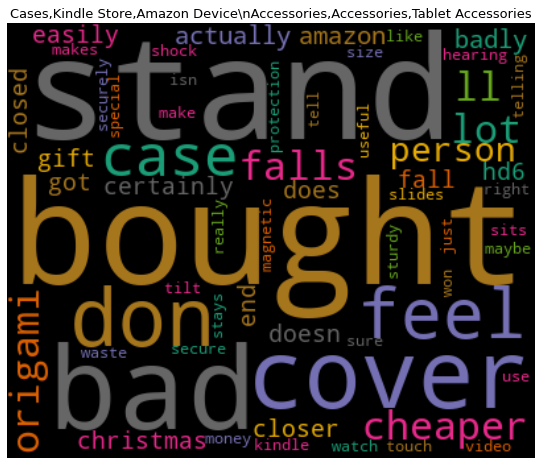

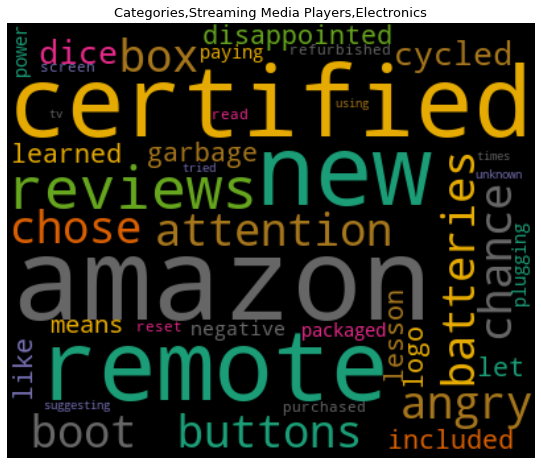

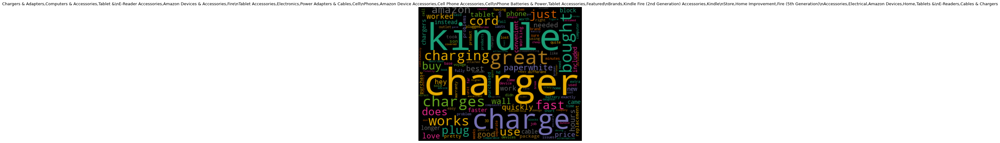

...

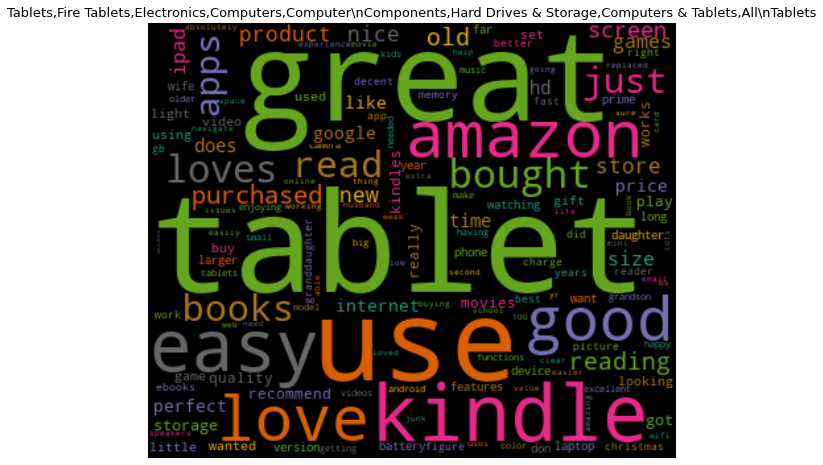

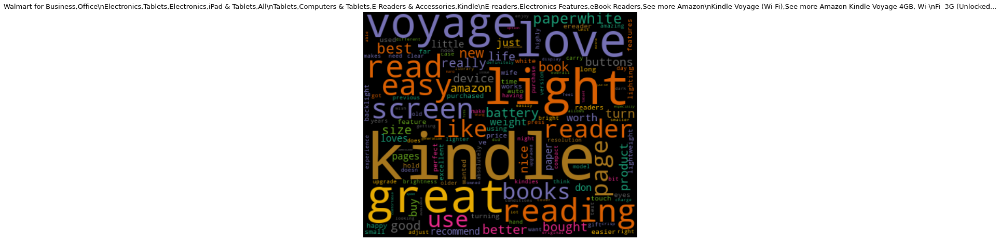

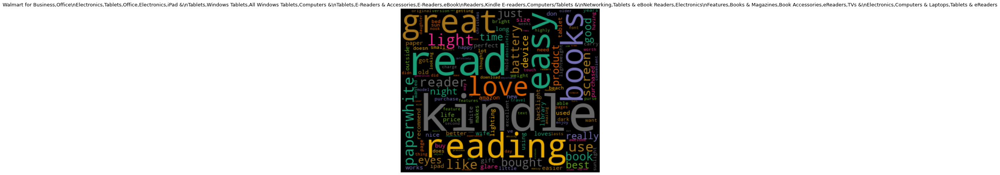

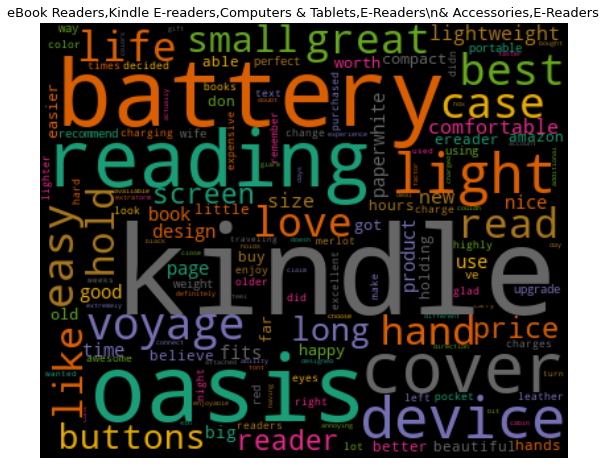

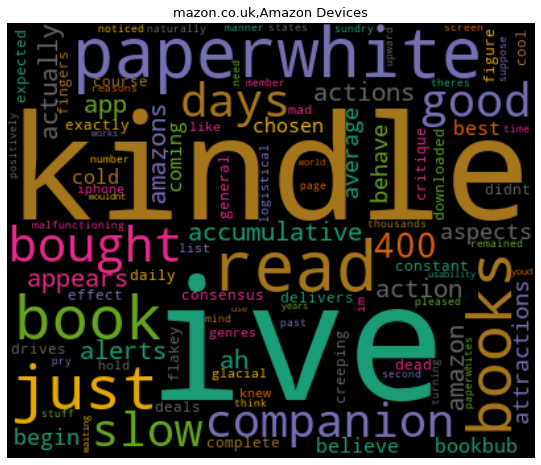

In [71]:
# Plotting by category
for index, product in enumerate(df_dtm.columns):
    generate_wordcloud(df_dtm[product], product)

### Almacenamiento de features

In [72]:
pickle.dump(data, open("saved_feats/data", "wb"))